In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import argparse
import glob
import os
import random

import numpy as np
import torchvision.transforms.functional as T
from PIL import Image
from torch.backends import cudnn
from torchvision.transforms import RandomCrop

import pandas as pd
import torchvision.transforms.functional as TF
from torch.utils.data import Dataset, DataLoader
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
from tqdm.notebook import tqdm

In [2]:
train = '/kaggle/input/rain13kdataset/train/train/Rain13K'
test = '/kaggle/input/rain13kdataset/test/test'

# Model

In [ ]:
class MDTA(nn.Module):
    def __init__(self, channels, num_heads):
        super(MDTA, self).__init__()
        self.num_heads = num_heads
        self.temperature = nn.Parameter(torch.ones(1, num_heads, 1, 1))

        self.qkv = nn.Conv2d(channels, channels * 3, kernel_size=1, bias=False)
        self.qkv_conv = nn.Conv2d(channels * 3, channels * 3, kernel_size=3, padding=1, groups=channels * 3, bias=False)
        self.project_out = nn.Conv2d(channels, channels, kernel_size=1, bias=False)

    def forward(self, x):
        b, c, h, w = x.shape
        q, k, v = self.qkv_conv(self.qkv(x)).chunk(3, dim=1)

        q = q.reshape(b, self.num_heads, -1, h * w)
        k = k.reshape(b, self.num_heads, -1, h * w)
        v = v.reshape(b, self.num_heads, -1, h * w)
        q, k = F.normalize(q, dim=-1), F.normalize(k, dim=-1)

        attn = torch.softmax(torch.matmul(q, k.transpose(-2, -1).contiguous()) * self.temperature, dim=-1)
        out = self.project_out(torch.matmul(attn, v).reshape(b, -1, h, w))
        return out


class GDFN(nn.Module):
    def __init__(self, channels, expansion_factor):
        super(GDFN, self).__init__()

        hidden_channels = int(channels * expansion_factor)
        self.project_in = nn.Conv2d(channels, hidden_channels * 2, kernel_size=1, bias=False)
        self.conv = nn.Conv2d(hidden_channels * 2, hidden_channels * 2, kernel_size=3, padding=1,
                              groups=hidden_channels * 2, bias=False)
        self.project_out = nn.Conv2d(hidden_channels, channels, kernel_size=1, bias=False)

    def forward(self, x):
        x1, x2 = self.conv(self.project_in(x)).chunk(2, dim=1)
        x = self.project_out(F.gelu(x1) * x2)
        return x


class TransformerBlock(nn.Module):
    def __init__(self, channels, num_heads, expansion_factor):
        super(TransformerBlock, self).__init__()

        self.norm1 = nn.LayerNorm(channels)
        self.attn = MDTA(channels, num_heads)
        self.norm2 = nn.LayerNorm(channels)
        self.ffn = GDFN(channels, expansion_factor)

    def forward(self, x):
        b, c, h, w = x.shape
        x = x + self.attn(self.norm1(x.reshape(b, c, -1).transpose(-2, -1).contiguous()).transpose(-2, -1)
                          .contiguous().reshape(b, c, h, w))
        x = x + self.ffn(self.norm2(x.reshape(b, c, -1).transpose(-2, -1).contiguous()).transpose(-2, -1)
                         .contiguous().reshape(b, c, h, w))
        return x


class DownSample(nn.Module):
    def __init__(self, channels):
        super(DownSample, self).__init__()
        self.body = nn.Sequential(nn.Conv2d(channels, channels // 2, kernel_size=3, padding=1, bias=False),
                                  nn.PixelUnshuffle(2))

    def forward(self, x):
        return self.body(x)


class UpSample(nn.Module):
    def __init__(self, channels):
        super(UpSample, self).__init__()
        self.body = nn.Sequential(nn.Conv2d(channels, channels * 2, kernel_size=3, padding=1, bias=False),
                                  nn.PixelShuffle(2))

    def forward(self, x):
        return self.body(x)


class Restormer(nn.Module):
    def __init__(self, num_blocks=[4, 6, 6, 8], num_heads=[1, 2, 4, 8], channels=[48, 96, 192, 384], num_refinement=4,
                 expansion_factor=2.66):
        super(Restormer, self).__init__()

        self.embed_conv = nn.Conv2d(3, channels[0], kernel_size=3, padding=1, bias=False)

        self.encoders = nn.ModuleList([nn.Sequential(*[TransformerBlock(
            num_ch, num_ah, expansion_factor) for _ in range(num_tb)]) for num_tb, num_ah, num_ch in
                                       zip(num_blocks, num_heads, channels)])
        # the number of down sample or up sample == the number of encoder - 1
        self.downs = nn.ModuleList([DownSample(num_ch) for num_ch in channels[:-1]])
        self.ups = nn.ModuleList([UpSample(num_ch) for num_ch in list(reversed(channels))[:-1]])
        # the number of reduce block == the number of decoder - 1
        self.reduces = nn.ModuleList([nn.Conv2d(channels[i], channels[i - 1], kernel_size=1, bias=False)
                                      for i in reversed(range(2, len(channels)))])
        # the number of decoder == the number of encoder - 1
        self.decoders = nn.ModuleList([nn.Sequential(*[TransformerBlock(channels[2], num_heads[2], expansion_factor)
                                                       for _ in range(num_blocks[2])])])
        self.decoders.append(nn.Sequential(*[TransformerBlock(channels[1], num_heads[1], expansion_factor)
                                             for _ in range(num_blocks[1])]))
        # the channel of last one is not change
        self.decoders.append(nn.Sequential(*[TransformerBlock(channels[1], num_heads[0], expansion_factor)
                                             for _ in range(num_blocks[0])]))

        self.refinement = nn.Sequential(*[TransformerBlock(channels[1], num_heads[0], expansion_factor)
                                          for _ in range(num_refinement)])
        self.output = nn.Conv2d(channels[1], 3, kernel_size=3, padding=1, bias=False)

    def forward(self, x):
        fo = self.embed_conv(x)
        out_enc1 = self.encoders[0](fo)
        out_enc2 = self.encoders[1](self.downs[0](out_enc1))
        out_enc3 = self.encoders[2](self.downs[1](out_enc2))
        out_enc4 = self.encoders[3](self.downs[2](out_enc3))

        out_dec3 = self.decoders[0](self.reduces[0](torch.cat([self.ups[0](out_enc4), out_enc3], dim=1)))
        out_dec2 = self.decoders[1](self.reduces[1](torch.cat([self.ups[1](out_dec3), out_enc2], dim=1)))
        fd = self.decoders[2](torch.cat([self.ups[2](out_dec2), out_enc1], dim=1))
        fr = self.refinement(fd)
        out = self.output(fr) + x
        return out

In [4]:
def psnr(x, y, data_range=255.0):
    x, y = x / data_range, y / data_range
    mse = torch.mean((x - y) ** 2)
    score = - 10 * torch.log10(mse)
    return score


def ssim(x, y, kernel_size=11, kernel_sigma=1.5, data_range=255.0, k1=0.01, k2=0.03):
    x, y = x / data_range, y / data_range
    # average pool image if the size is large enough
    f = max(1, round(min(x.size()[-2:]) / 256))
    if f > 1:
        x, y = F.avg_pool2d(x, kernel_size=f), F.avg_pool2d(y, kernel_size=f)

    # gaussian filter
    coords = torch.arange(kernel_size, dtype=x.dtype, device=x.device)
    coords -= (kernel_size - 1) / 2.0
    g = coords ** 2
    g = (- (g.unsqueeze(0) + g.unsqueeze(1)) / (2 * kernel_sigma ** 2)).exp()
    g /= g.sum()
    kernel = g.unsqueeze(0).repeat(x.size(1), 1, 1, 1)

    # compute
    c1, c2 = k1 ** 2, k2 ** 2
    n_channels = x.size(1)
    mu_x = F.conv2d(x, weight=kernel, stride=1, padding=0, groups=n_channels)
    mu_y = F.conv2d(y, weight=kernel, stride=1, padding=0, groups=n_channels)

    mu_xx, mu_yy, mu_xy = mu_x ** 2, mu_y ** 2, mu_x * mu_y
    sigma_xx = F.conv2d(x ** 2, weight=kernel, stride=1, padding=0, groups=n_channels) - mu_xx
    sigma_yy = F.conv2d(y ** 2, weight=kernel, stride=1, padding=0, groups=n_channels) - mu_yy
    sigma_xy = F.conv2d(x * y, weight=kernel, stride=1, padding=0, groups=n_channels) - mu_xy

    # contrast sensitivity (CS) with alpha = beta = gamma = 1.
    cs = (2.0 * sigma_xy + c2) / (sigma_xx + sigma_yy + c2)
    # structural similarity (SSIM)
    ss = (2.0 * mu_xy + c1) / (mu_xx + mu_yy + c1) * cs
    return ss.mean()

# config

In [ ]:
TRAIN_PATH = '/kaggle/input/rain13kdataset/train/train/Rain13K'
TEST_PATH = '/kaggle/input/rain13kdataset/test/test'
SAVE_PATH = './results/Rain13K'
DATA_NAME = 'Rain13K'

NUM_BLOCKS = [3, 4, 4, 6]      
NUM_HEADS = [1, 2, 2, 4]         
CHANNELS = [32, 64, 128, 256]    
EXPANSION_FACTOR = 2.66
NUM_REFINEMENT = 2            

NUM_ITER = 50000                                            
BATCH_SIZES =  [8, 6, 4, 2]                           
PATCH_SIZES = [96, 128, 160, 192]                           
MILESTONES = [12500, 25000, 37500]           
LR = 3e-4
WORKERS = 2
SEED = 42
MODEL_FILE = None 

In [ ]:
if not os.path.exists(SAVE_PATH):
    os.makedirs(SAVE_PATH)

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

In [7]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
def rgb_to_y(x):
    rgb_to_grey = torch.tensor([0.256789, 0.504129, 0.097906], dtype=x.dtype, device=x.device).view(1, -1, 1, 1)
    return torch.sum(x * rgb_to_grey, dim=1, keepdim=True).add(16.0)

def pad_image_needed(img, size):
    # Pad ảnh nếu kích thước nhỏ hơn patch_size
    width, height = TF.get_image_size(img)
    if width < size[1]:
        img = TF.pad(img, [size[1] - width, 0], padding_mode='reflect')
    if height < size[0]:
        img = TF.pad(img, [0, size[0] - height], padding_mode='reflect')
    return img

# Build Dataset

In [9]:
import os
from PIL import Image
import torchvision.transforms.functional as TF
import torchvision.transforms as T
import torch.nn.functional as F
from torch.utils.data import Dataset

class RainDataset(Dataset):
    def __init__(self, input_list, target_list, is_train=True, patch_size=128, length=None):
        self.is_train = is_train
        self.patch_size = patch_size
        
        # Nhận list file trực tiếp từ train_test_split
        self.rain_images = input_list
        self.norain_images = target_list

        self.num = len(self.rain_images)
        # length dùng cho Progressive Learning (nếu không truyền vào thì lấy len thực tế)
        self.sample_num = length if (self.is_train and length is not None) else self.num

    def __len__(self):
        return self.sample_num

    def __getitem__(self, idx):
        # Lấy file theo index (modulo để tránh lỗi nếu sample_num > num)
        real_idx = idx % self.num
        image_name = os.path.basename(self.rain_images[real_idx])
        
        rain_pil = Image.open(self.rain_images[real_idx]).convert('RGB')
        norain_pil = Image.open(self.norain_images[real_idx]).convert('RGB')
        
        rain = TF.to_tensor(rain_pil)
        norain = TF.to_tensor(norain_pil)
        
        h, w = rain.shape[1:]

        if self.is_train:
            # Logic Random Crop cho tập Train
            rain = pad_image_needed(rain, (self.patch_size, self.patch_size))
            norain = pad_image_needed(norain, (self.patch_size, self.patch_size))
            
            i, j, th, tw = T.RandomCrop.get_params(rain, (self.patch_size, self.patch_size))
            rain = TF.crop(rain, i, j, th, tw)
            norain = TF.crop(norain, i, j, th, tw)
            
            if torch.rand(1) < 0.5:
                rain = TF.hflip(rain)
                norain = TF.hflip(norain)
            if torch.rand(1) < 0.5:
                rain = TF.vflip(rain)
                norain = TF.vflip(norain)
        else:
            # Logic Padding cho tập Valid/Test (giữ nguyên ảnh gốc, chỉ pad cho chia hết 8)
            new_h, new_w = ((h + 8) // 8) * 8, ((w + 8) // 8) * 8
            pad_h = new_h - h if h % 8 != 0 else 0
            pad_w = new_w - w if w % 8 != 0 else 0
            rain = F.pad(rain, (0, pad_w, 0, pad_h), 'reflect')
            norain = F.pad(norain, (0, pad_w, 0, pad_h), 'reflect')
        return rain, norain, image_name, h, w

In [ ]:
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader

data_path = '/kaggle/input/rain13kdataset/train/train/Rain13K'
test_size = 0.2

input_folder = os.path.join(data_path, 'input')
target_folder = os.path.join(data_path, 'target')

input_files = sorted([os.path.join(input_folder, f) for f in os.listdir(input_folder) 
                      if f.endswith(('.png', '.jpg', '.jpeg'))])
target_files = sorted([os.path.join(target_folder, f) for f in os.listdir(target_folder) 
                       if f.endswith(('.png', '.jpg', '.jpeg'))])

print(f"Tổng số ảnh tìm thấy: {len(input_files)}")

train_inputs, val_inputs, train_targets, val_targets = train_test_split(
    input_files, target_files, test_size=test_size, random_state=42
)

print(f"Số lượng Train: {len(train_inputs)}")
print(f"Số lượng Valid: {len(val_inputs)}")

# Tạo Dataset và DataLoader cho Valid (Train Loader sẽ tạo trong vòng lặp chính vì Progressive Learning)
# Valid set thì cố định, không đổi kích thước crop
val_dataset = RainDataset(val_inputs, val_targets, is_train=False)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=WORKERS)

Tổng số ảnh tìm thấy: 13711
Số lượng Train: 10968
Số lượng Valid: 2743


# Validation

In [11]:
# sửa
import pandas as pd
import os
import torch
import torch.nn.functional as F
from tqdm.notebook import tqdm
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR

# --- CẤU HÌNH EARLY STOPPING ---
PATIENCE = 10  
patience_counter = 0 # Biến đếm số lần không cải thiện

# --- GLOBAL VARIABLES CHO SAVING ---
best_psnr, best_ssim = 0.0, 0.0
results = {'PSNR': [], 'SSIM': [], 'Loss': []}


def validation(net, loader, max_size=384):
    """
    Validation với xử lý ảnh lớn để tránh OOM
    max_size: Resize ảnh về kích thước tối đa trước khi inference
    """
    net.eval()
    total_psnr, total_ssim, count = 0.0, 0.0, 0
    
    with torch.no_grad():
        for rain, norain, _, h, w in tqdm(loader, desc="Validating", leave=False):
            rain, norain = rain.to(DEVICE), norain.to(DEVICE)
            
            # Lấy kích thước gốc
            original_h, original_w = h.item(), w.item()
            
            # Xử lý ảnh lớn
            if max(original_h, original_w) > max_size:
                scale = max_size / max(original_h, original_w)
                new_h = int(original_h * scale)
                new_w = int(original_w * scale)
                
                # Đảm bảo chia hết cho 8
                new_h = ((new_h + 8) // 8) * 8
                new_w = ((new_w + 8) // 8) * 8
                
                # Resize
                rain_resized = F.interpolate(rain, size=(new_h, new_w), mode='bilinear', align_corners=False)
                norain_resized = F.interpolate(norain, size=(new_h, new_w), mode='bilinear', align_corners=False)
                
                # Forward
                out = net(rain_resized)
                
                # Crop về kích thước chính xác (loại bỏ padding nếu có)
                out = out[:, :, :new_h, :new_w]
                norain_resized = norain_resized[:, :, :new_h, :new_w]
                
                # Clamp & Convert
                out = torch.clamp(out, 0, 1).mul(255).byte()
                norain_final = torch.clamp(norain_resized, 0, 1).mul(255).byte()
                
            else:
                # Ảnh nhỏ, xử lý bình thường
                out = net(rain)
                
                # Crop về kích thước gốc & Clamp
                out = out[:, :, :original_h, :original_w]
                norain_crop = norain[:, :, :original_h, :original_w]
                
                out = torch.clamp(out, 0, 1).mul(255).byte()
                norain_final = torch.clamp(norain_crop, 0, 1).mul(255).byte()
            
            # Tính metrics trên Y channel
            y = rgb_to_y(out.double())
            gt = rgb_to_y(norain_final.double())
            
            total_psnr += psnr(y, gt).item()
            total_ssim += ssim(y, gt).item()
            count += 1
            
            # Xóa tensor để giải phóng RAM (chỉ xóa những cái lớn)
            del rain, norain, out, y, gt, norain_final
    torch.cuda.empty_cache()
    if count == 0:
        return 0.0, 0.0
    return total_psnr/count, total_ssim/count

# --- HÀM LƯU LOG (LOGGING ONLY) ---
def save_log_csv(val_psnr, val_ssim, n_iter):
    # Cập nhật metrics vào list global
    results['PSNR'].append(val_psnr)
    results['SSIM'].append(val_ssim)
    
    # Lưu CSV Log
    df = pd.DataFrame(data={'Loss': results['Loss'][-1:] if results['Loss'] else [0], 
                            'PSNR': [val_psnr], 
                            'SSIM': [val_ssim]})
    df.to_csv(os.path.join(SAVE_PATH, 'log.csv'), mode='a', header=not os.path.exists(os.path.join(SAVE_PATH, 'log.csv')))
    
    print(f"Iter: {n_iter} | Loss: {results['Loss'][-1]:.4f} | PSNR: {val_psnr:.2f} | SSIM: {val_ssim:.3f}")



# Test

In [ ]:
import os
import glob
import torch
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm
import torchvision.transforms.functional as TF

TEST_ROOT = '/kaggle/input/rain13kdataset/test/test'  
SAVE_DIR = './results/Benchmark_Results'             
MODEL_PATH = os.path.join('/kaggle/input/deraining-restormer-model/keras/default/2/results/Rain13K/best_model.pth') 
            

if not os.path.exists(SAVE_DIR):
    os.makedirs(SAVE_DIR)

In [ ]:
def evaluate_dataset(net, loader, dataset_name):
    net.eval()
    total_psnr, total_ssim = 0.0, 0.0
    count = 0
    
    ds_save_dir = os.path.join(SAVE_DIR, dataset_name)
    if not os.path.exists(ds_save_dir): os.makedirs(ds_save_dir)
    
    print(f"--> Đang đánh giá: {dataset_name}...")
    
    with torch.no_grad():
        for i, (rain, norain, name, h, w) in enumerate(tqdm(loader, leave=False)):
            rain, norain = rain.to(DEVICE), norain.to(DEVICE)
            
            # chạy Full ảnh, nếu OOM thì resize
            try:
                out = net(rain)
            except RuntimeError as e:
                if "out of memory" in str(e):
                    torch.cuda.empty_cache()
                    # Fallback: Resize về 512x512 nếu ảnh quá to
                    print(f"  [WARN] OOM ảnh {name[0]}, đang resize để chạy...")
                    rain = F.interpolate(rain, size=(512, 512), mode='bilinear')
                    out = net(rain)
                    # Resize lại norain để tính metric (chấp nhận sai số nhỏ do resize)
                    norain = F.interpolate(norain, size=(512, 512), mode='bilinear')
                    h, w = torch.tensor(512), torch.tensor(512)
                else:
                    raise e

            # Cắt padding (nếu có)
            valid_h, valid_w = h.item(), w.item()
            out = out[:, :, :valid_h, :valid_w]
            norain = norain[:, :, :valid_h, :valid_w]
            rain_viz = rain[:, :, :valid_h, :valid_w]

            # Clamp & Convert
            out = torch.clamp(out, 0, 1)
            norain = torch.clamp(norain, 0, 1)
            
            # Tính Metrics
            out_byte = (out * 255).byte()
            norain_byte = (norain * 255).byte()
            
            y = rgb_to_y(out_byte.double())
            gt = rgb_to_y(norain_byte.double())
            
            total_psnr += psnr(y, gt).item()
            total_ssim += ssim(y, gt).item()
            count += 1
            
            if i < 3:
                img_in = T.ToPILImage()(rain_viz.squeeze().cpu())
                img_out = T.ToPILImage()(out.squeeze().cpu())
                img_gt = T.ToPILImage()(norain.squeeze().cpu())
                
                w_img, h_img = img_in.size
                combined = Image.new('RGB', (w_img * 3, h_img))
                combined.paste(img_in, (0, 0))
                combined.paste(img_out, (w_img, 0))
                combined.paste(img_gt, (w_img * 2, 0))
                
                save_path = os.path.join(ds_save_dir, f"{name[0]}")
                combined.save(save_path)
    
    if count == 0: return 0, 0
    return total_psnr / count, total_ssim / count

In [ ]:
model = Restormer(NUM_BLOCKS, NUM_HEADS, CHANNELS, NUM_REFINEMENT, EXPANSION_FACTOR).to(DEVICE)

if os.path.exists(MODEL_PATH):
    checkpoint = torch.load(MODEL_PATH, map_location=DEVICE)
    if 'model_state_dict' in checkpoint:
        model.load_state_dict(checkpoint['model_state_dict'])
        print(f"Đã load weights từ Best Model (Iter: {checkpoint.get('iteration')})")
    else:
        model.load_state_dict(checkpoint)
        print("Đã load weights state_dict thuần.")
else:
    print(f"LỖI: Không tìm thấy {MODEL_PATH}")

sub_datasets = sorted([d for d in os.listdir(TEST_ROOT) if os.path.isdir(os.path.join(TEST_ROOT, d))])
print(f"Tìm thấy các bộ dữ liệu: {sub_datasets}")

benchmark_results = []

for ds_name in sub_datasets:
    ds_path = os.path.join(TEST_ROOT, ds_name)
    
    input_folder = os.path.join(ds_path, 'input')
    target_folder = os.path.join(ds_path, 'target')
    
    inputs = sorted([os.path.join(input_folder, f) for f in os.listdir(input_folder) 
                          if f.endswith(('.png', '.jpg', '.jpeg'))])
    targets = sorted([os.path.join(target_folder, f) for f in os.listdir(target_folder) 
                           if f.endswith(('.png', '.jpg', '.jpeg'))])

    if len(inputs) == 0:
        print(f"Bỏ qua {ds_name} (Không có ảnh)")
        continue
        
    test_ds = RainDataset(inputs, targets, is_train=False)
    test_loader = DataLoader(test_ds, batch_size=1, shuffle=False, num_workers=2)
    
    # Đánh giá
    avg_psnr, avg_ssim = evaluate_dataset(model, test_loader, ds_name)
    
    benchmark_results.append({
        'Dataset': ds_name,
        'PSNR': avg_psnr,
        'SSIM': avg_ssim,
        'Samples': len(inputs)
    })
    
    print(f"Result {ds_name}: PSNR={avg_psnr:.2f} | SSIM={avg_ssim:.4f}\n")


Đã load weights từ Best Model (Iter: 47000)
Tìm thấy các bộ dữ liệu: ['Rain100H', 'Rain100L', 'Test100', 'Test1200', 'Test2800']
--> Đang đánh giá: Rain100H...


  0%|          | 0/100 [00:00<?, ?it/s]

Result Rain100H: PSNR=29.01 | SSIM=0.8621

--> Đang đánh giá: Rain100L...


  0%|          | 0/100 [00:00<?, ?it/s]

Result Rain100L: PSNR=34.67 | SSIM=0.9546

--> Đang đánh giá: Test100...


  0%|          | 0/98 [00:00<?, ?it/s]

Result Test100: PSNR=29.11 | SSIM=0.9010

--> Đang đánh giá: Test1200...


  0%|          | 0/1200 [00:00<?, ?it/s]

Result Test1200: PSNR=32.33 | SSIM=0.9375

--> Đang đánh giá: Test2800...


  0%|          | 0/2800 [00:00<?, ?it/s]

Result Test2800: PSNR=33.01 | SSIM=0.9521



In [ ]:
print("BẢNG TỔNG HỢP KẾT QUẢ")
df = pd.DataFrame(benchmark_results)
if not df.empty:
    display(df)
    df.to_csv(os.path.join(SAVE_DIR, 'benchmark_summary.csv'), index=False)
else:
    print("Chưa có kết quả nào.")

BẢNG TỔNG HỢP KẾT QUẢ


,Dataset,PSNR,SSIM,Samples
0,Rain100H,29.011949,0.862078,100
1,Rain100L,34.674775,0.954568,100
2,Test100,29.107944,0.901043,98
3,Test1200,32.333646,0.937451,1200
4,Test2800,33.011000,0.952113,2800



--- Ảnh từ tập: Rain100H ---


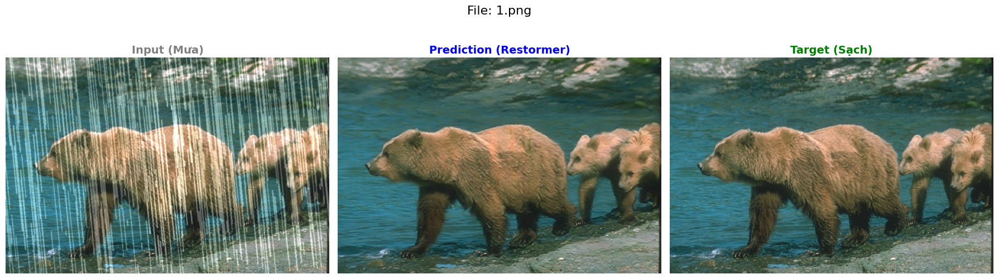

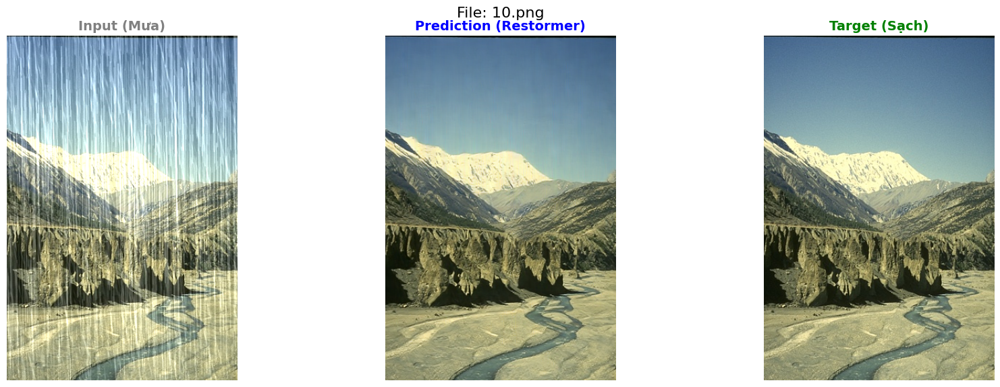


--- Ảnh từ tập: Rain100L ---


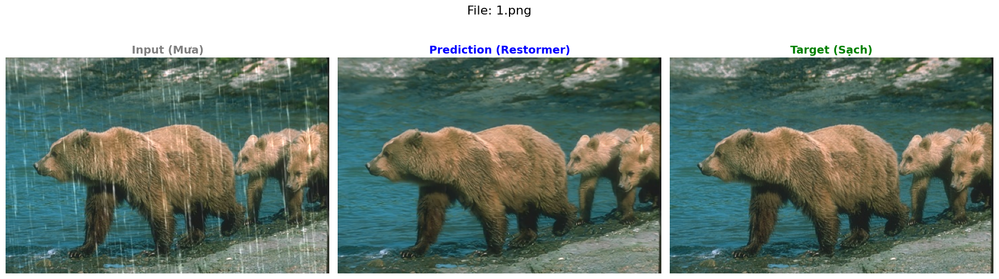

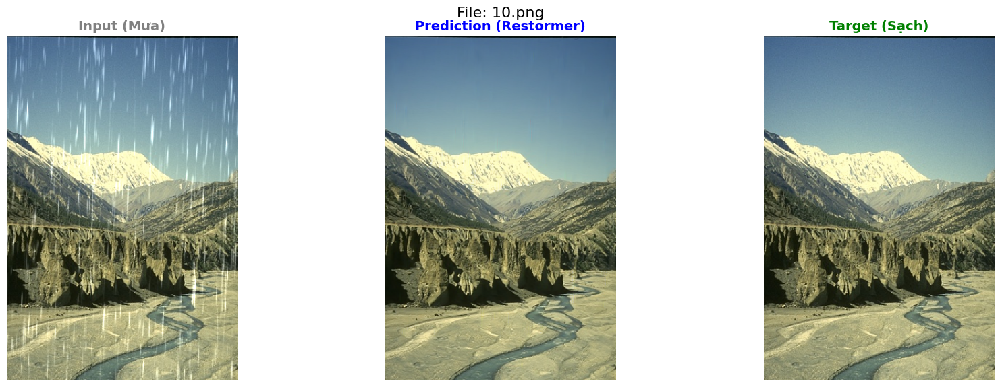


--- Ảnh từ tập: Test100 ---


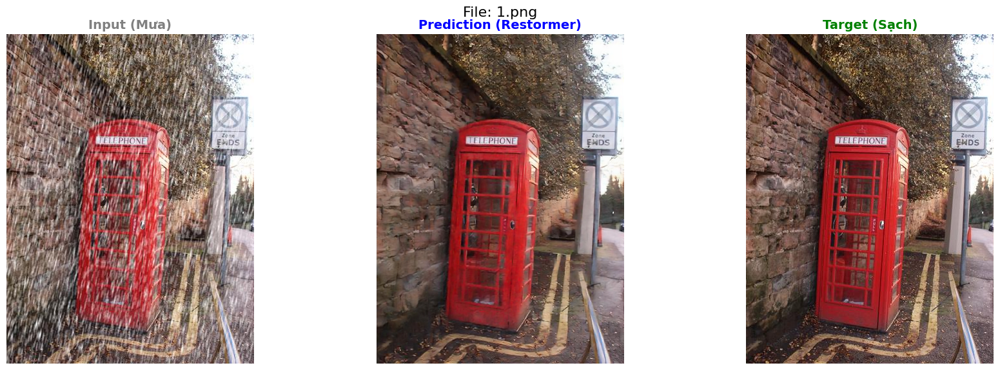

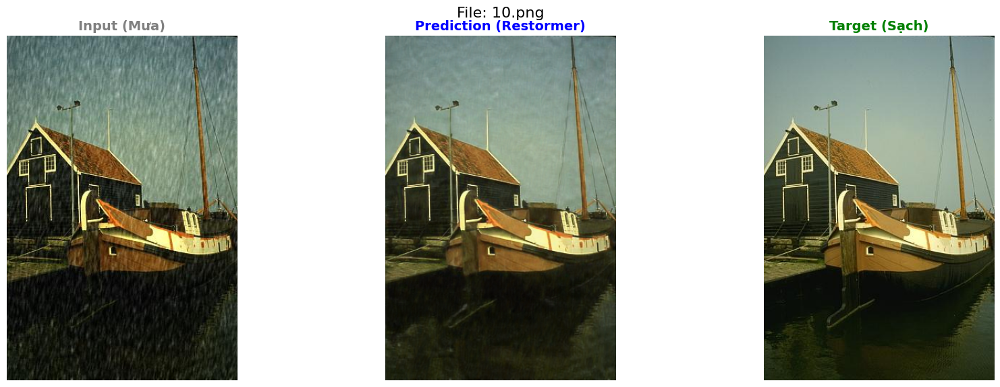


--- Ảnh từ tập: Test1200 ---


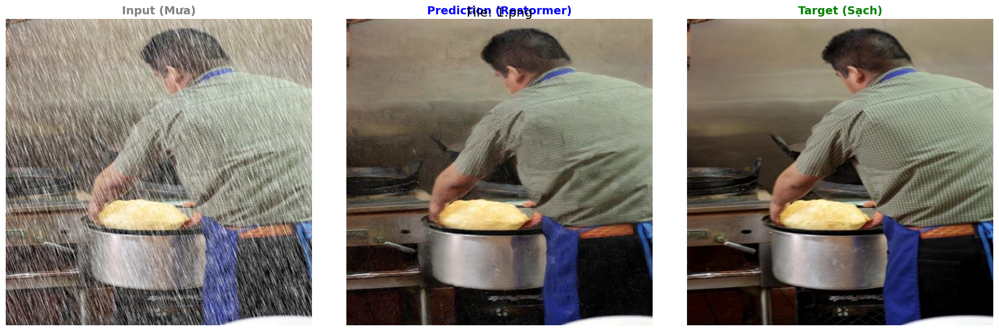

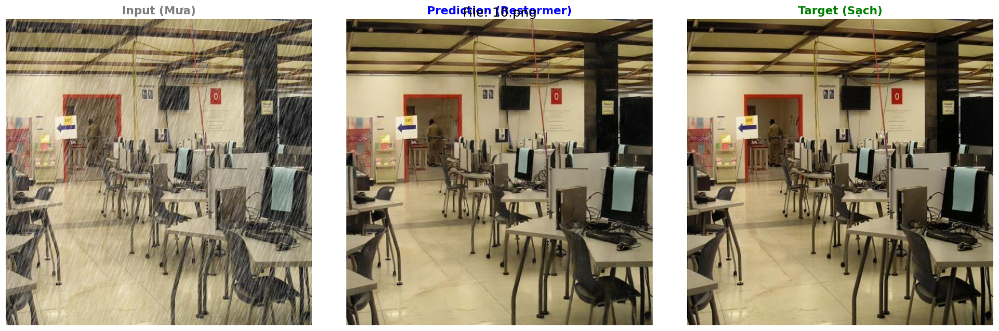


--- Ảnh từ tập: Test2800 ---


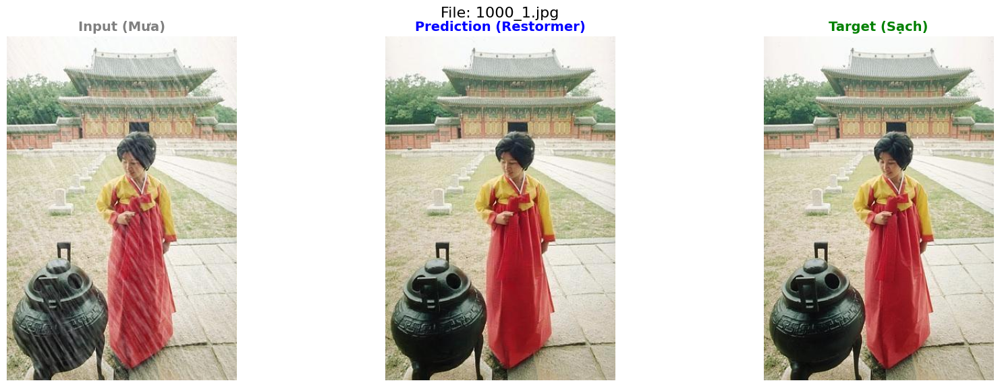

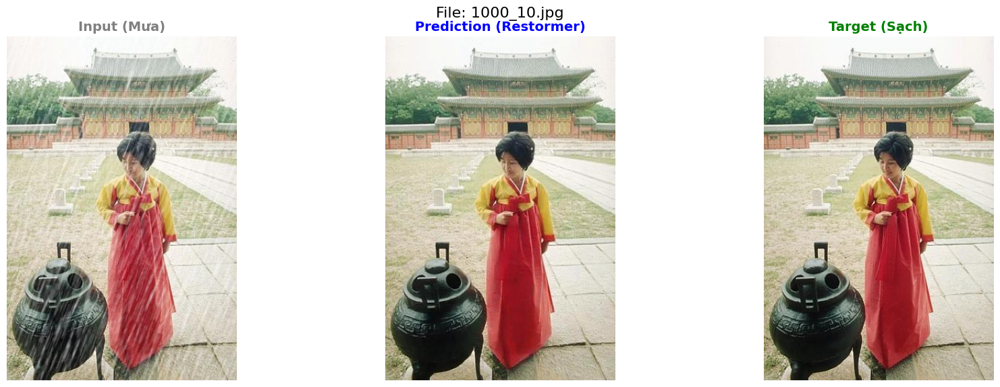

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os
import glob

def show_sample_results(ds_name):
    img_dir = os.path.join(SAVE_DIR, ds_name)
    images = sorted(glob.glob(os.path.join(img_dir, '*.*')))
    
    if not images:
        print(f"Không tìm thấy ảnh nào trong {img_dir}")
        return
    
    print(f"\n--- Ảnh từ tập: {ds_name} ---")
    
    for img_path in images[:2]:
        img_combined = Image.open(img_path)
        w, h = img_combined.size
        single_w = w // 3
        
        img_input = img_combined.crop((0, 0, single_w, h))
        img_pred = img_combined.crop((single_w, 0, single_w * 2, h))
        img_target = img_combined.crop((single_w * 2, 0, w, h))
        
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        
        axes[0].imshow(img_input)
        axes[0].set_title("Input (Mưa)", fontsize=14, fontweight='bold', color='gray')
        axes[0].axis('off')
        
        axes[1].imshow(img_pred)
        axes[1].set_title("Prediction (Restormer)", fontsize=14, fontweight='bold', color='blue')
        axes[1].axis('off')
        
        axes[2].imshow(img_target)
        axes[2].set_title("Target (Sạch)", fontsize=14, fontweight='bold', color='green')
        axes[2].axis('off')
        
        plt.suptitle(f"File: {os.path.basename(img_path)}", fontsize=16, y=0.95)
        plt.tight_layout()
        plt.show()
        
if 'Rain100H' in sub_datasets: show_sample_results('Rain100H')
if 'Rain100L' in sub_datasets: show_sample_results('Rain100L')
if 'Test100' in sub_datasets: show_sample_results('Test100')
if 'Test1200' in sub_datasets: show_sample_results('Test1200')
if 'Test2800' in sub_datasets: show_sample_results('Test2800')
   
